# **Object detection using faster rcnn for crowd counting**

**Objective**: Detect small objects (specifically faces) in images to improve crowd counting in crowded scenes where people may overlap.

**Dataset Used:** Penn-Fudan Pedestrian Dataset, which contains images of pedestrians with corresponding segmentation masks.

**Approach:**

Modify the dataset to focus on detecting faces instead of full bodies.
Adjust the Faster R-CNN model to detect smaller objects by changing anchor sizes.
Implement data augmentation to improve model generalization.
Evaluate the model using precision, recall, and F1-score.



**Section 1: Importing Libraries**


In [9]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms as T
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.patches as patches
from torchvision.ops import nms


**Section 2: Downloading and Preparing the Dataset**

In [18]:
## Section 2: Accessing the Dataset from Google Drive

import os

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the path to your dataset in Google Drive
dataset_zip_path = '/content/drive/My Drive/RCNN/PennFudanPed.zip'

# Check if the dataset directory exists
if not os.path.exists('PennFudanPed'):
    print("Extracting the dataset from Google Drive...")
    # Copy the dataset zip file from Google Drive to the current working directory
    !cp "$dataset_zip_path" .
    # Unzip the dataset
    !unzip -q PennFudanPed.zip
else:
    print("Dataset already exists.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset already exists.


**Section 3: Defining the Custom Dataset Class**

In [19]:
class PennFudanFacesDataset(object):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # Load all image files, sorting to ensure alignment
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # Load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)
        mask = np.array(mask)
        # Instances are encoded as different colors
        obj_ids = np.unique(mask)
        obj_ids = obj_ids[1:]  # Remove background
        masks = mask == obj_ids[:, None, None]
        # Get bounding boxes for each mask (modified to focus on face region)
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            if pos[0].size == 0 or pos[1].size == 0:
                continue
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            # Modify bounding box to focus on face region (upper part of the body)
            height = ymax - ymin
            face_ymax = ymin + int(0.3 * height)  # Assume face in top 30% of bbox
            boxes.append([xmin, ymin, xmax, face_ymax])
        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.ones((len(boxes),), dtype=torch.int64)  # All objects are faces
        masks = torch.as_tensor(masks, dtype=torch.uint8)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels, "masks": masks,
                  "image_id": image_id, "area": area, "iscrowd": iscrowd}
        if self.transforms:
            img = self.transforms(img)
        return img, target

    def __len__(self):
        return len(self.imgs)


**Section 4: Defining Data Transformations**


In [20]:
def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
        transforms.append(T.ColorJitter(brightness=0.5, contrast=0.5))
    return T.Compose(transforms)


**Section 5: Preparing Data Loaders**


In [21]:
# Prepare the dataset and data loaders
dataset = PennFudanFacesDataset('PennFudanPed', get_transform(train=True))
dataset_test = PennFudanFacesDataset('PennFudanPed', get_transform(train=False))
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()

# Use subsets for training and testing
train_size = int(0.8 * len(indices))
dataset = torch.utils.data.Subset(dataset, indices[:train_size])  # 80% for training
dataset_test = torch.utils.data.Subset(dataset_test, indices[train_size:])  # Remaining for testing

data_loader = torch.utils.data.DataLoader(dataset, batch_size=2, shuffle=True,
                                          num_workers=2, collate_fn=lambda x: tuple(zip(*x)))
data_loader_test = torch.utils.data.DataLoader(dataset_test, batch_size=1, shuffle=False,
                                               num_workers=2, collate_fn=lambda x: tuple(zip(*x)))


Dataset already exists.


**Section 6: Defining the Model**


In [22]:
def get_model(num_classes):
    # Load a pre-trained Faster R-CNN model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
    # Replace the classifier head
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    # Adjust anchor sizes for face detection
    sizes = ((2,), (4,), (8,), (16,), (32,))  # Reduced anchor sizes (half of previous sizes)
    aspect_ratios = ((0.75, 1.0, 1.5),) * len(sizes)  # Aspect ratios remain the same
    anchor_generator = torchvision.models.detection.rpn.AnchorGenerator(
      sizes=sizes, aspect_ratios=aspect_ratios)
    model.rpn.anchor_generator = anchor_generator
    return model

# Initialize the model, optimizer, and learning rate scheduler
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
num_classes = 2  # 1 class (face) + background
model = get_model(num_classes)
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0025, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 153MB/s]


**Section 7: Setting up the Training Loop**


In [23]:
# Training loop
num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    i = 0
    running_loss = 0.0
    for images, targets in data_loader:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        running_loss += losses.item()
        i += 1
        if i % 10 == 0:
            avg_loss = running_loss / 10
            print(f"Epoch [{epoch+1}/{num_epochs}], Iteration [{i}/{len(data_loader)}], Average Loss: {avg_loss:.4f}")
            running_loss = 0.0
    lr_scheduler.step()
print("Training completed!")


Epoch [1/5], Iteration [10/75], Average Loss: 0.5330
Epoch [1/5], Iteration [20/75], Average Loss: 0.3252
Epoch [1/5], Iteration [30/75], Average Loss: 0.4810
Epoch [1/5], Iteration [40/75], Average Loss: 0.2787
Epoch [1/5], Iteration [50/75], Average Loss: 0.3496
Epoch [1/5], Iteration [60/75], Average Loss: 0.3020
Epoch [1/5], Iteration [70/75], Average Loss: 0.2886
Epoch [2/5], Iteration [10/75], Average Loss: 0.3172
Epoch [2/5], Iteration [20/75], Average Loss: 0.2768
Epoch [2/5], Iteration [30/75], Average Loss: 0.2227
Epoch [2/5], Iteration [40/75], Average Loss: 0.2509
Epoch [2/5], Iteration [50/75], Average Loss: 0.2488
Epoch [2/5], Iteration [60/75], Average Loss: 0.2525
Epoch [2/5], Iteration [70/75], Average Loss: 0.2899
Epoch [3/5], Iteration [10/75], Average Loss: 0.2409
Epoch [3/5], Iteration [20/75], Average Loss: 0.2894
Epoch [3/5], Iteration [30/75], Average Loss: 0.2800
Epoch [3/5], Iteration [40/75], Average Loss: 0.2199
Epoch [3/5], Iteration [50/75], Average Loss: 

**Section 8: Evaluation and Visualization**


Image 1: Detected 2 faces


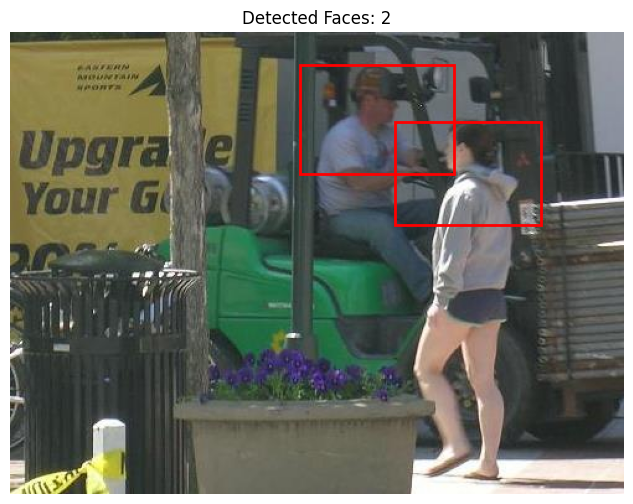

Image 2: Detected 1 faces


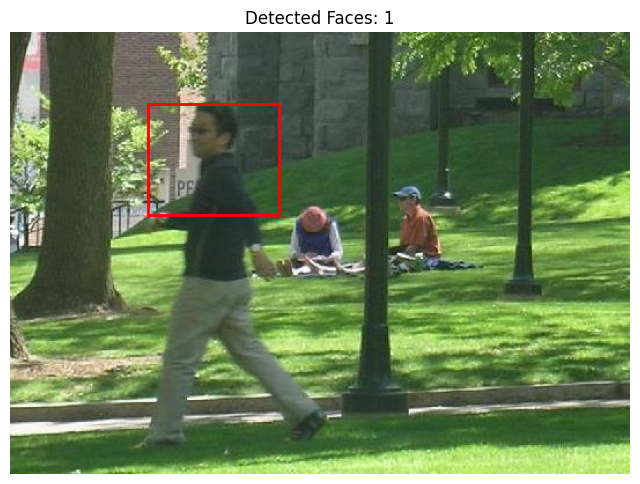

Image 3: Detected 2 faces


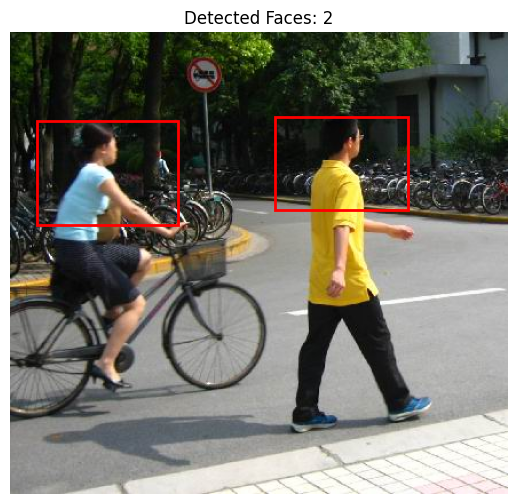

Image 4: Detected 1 faces


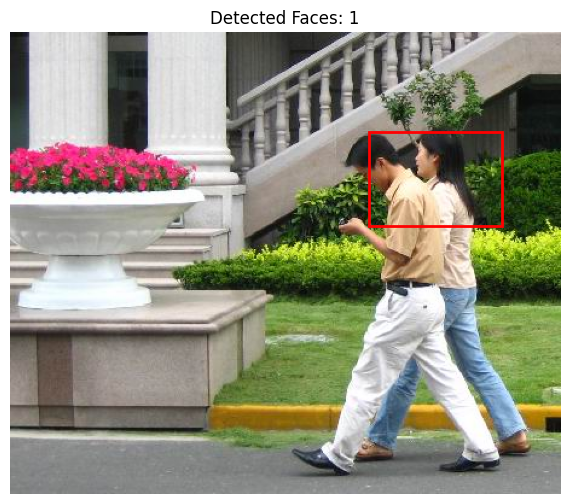

Image 5: Detected 5 faces


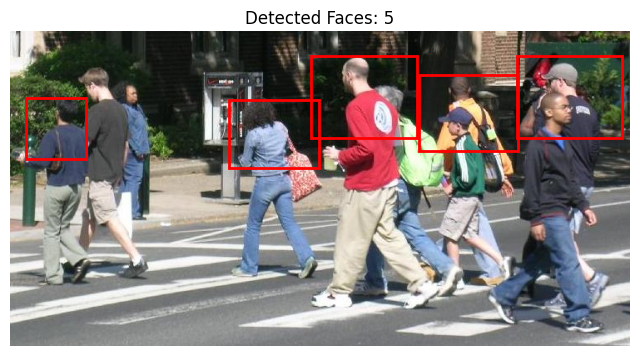

Image 6: Detected 1 faces


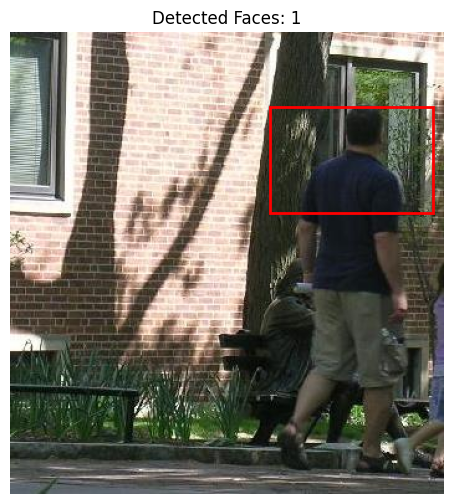

Image 7: Detected 1 faces


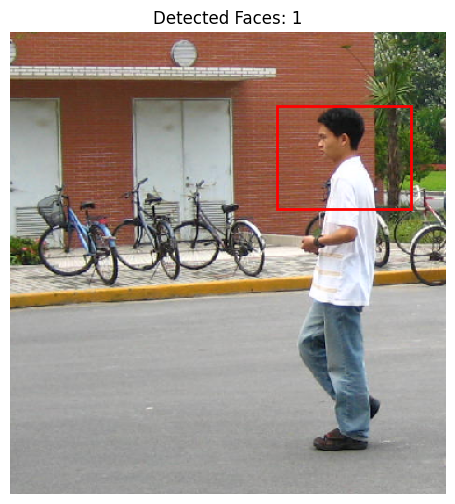

Image 8: Detected 4 faces


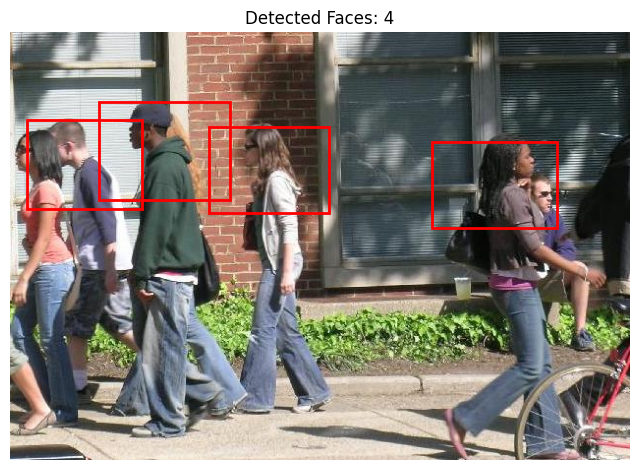

Image 9: Detected 2 faces


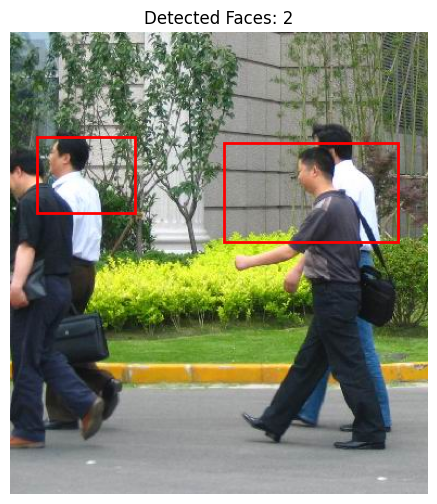

Image 10: Detected 2 faces


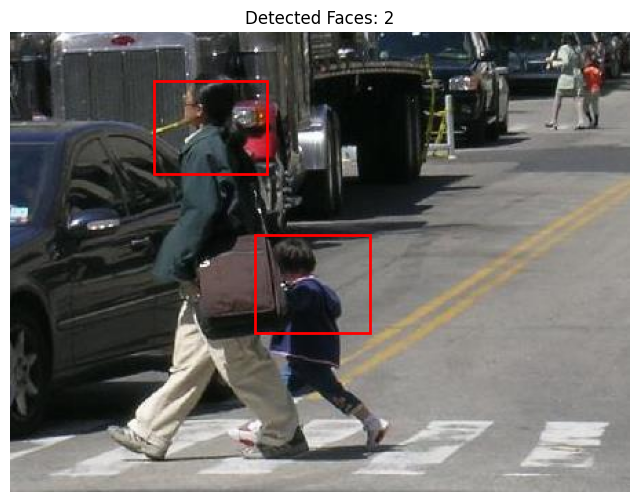

Image 11: Detected 2 faces


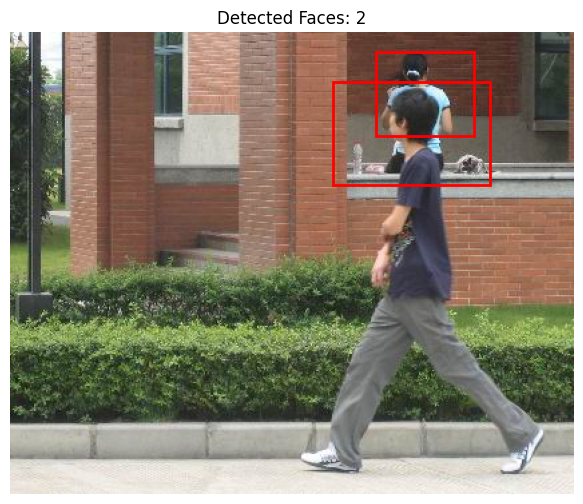

Image 12: Detected 2 faces


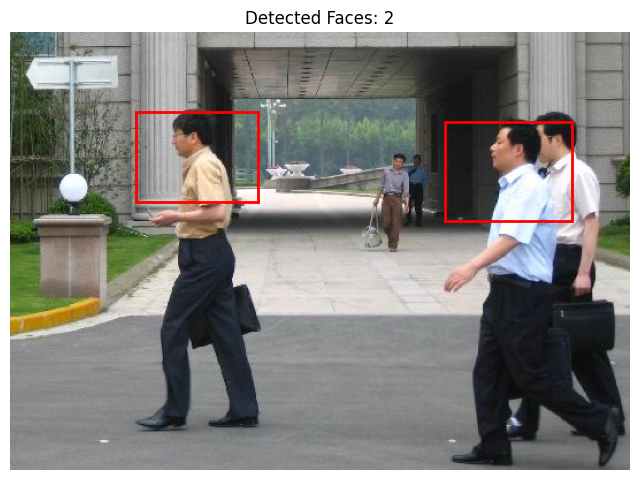

Image 13: Detected 1 faces


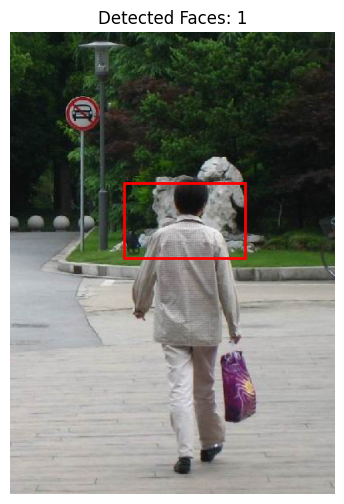

Image 14: Detected 2 faces


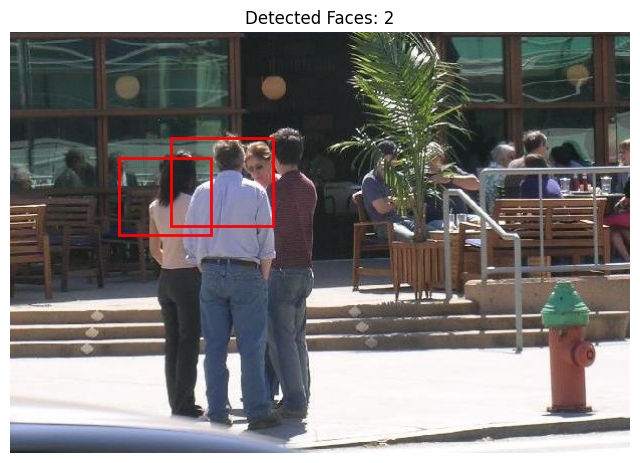

Image 15: Detected 2 faces


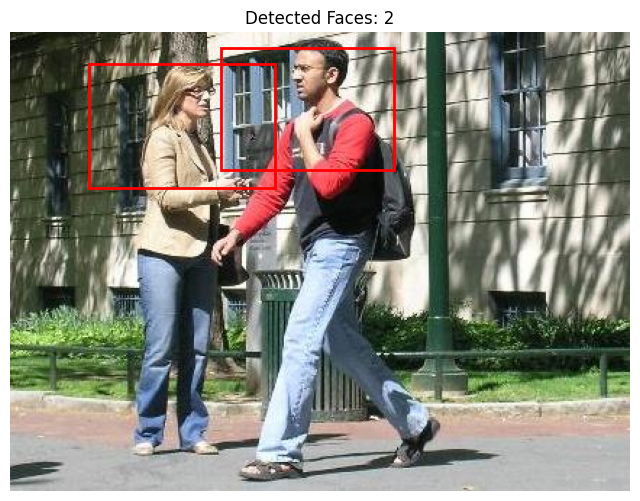

Image 16: Detected 2 faces


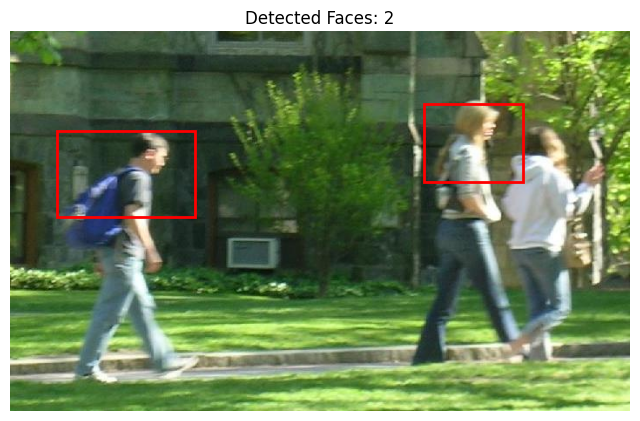

Image 17: Detected 1 faces


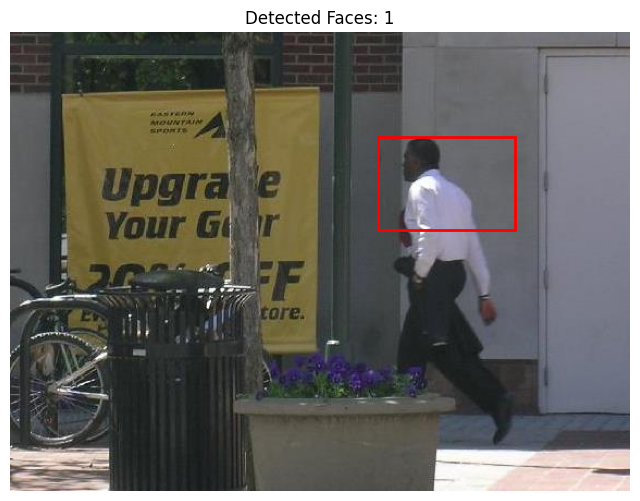

Image 18: Detected 2 faces


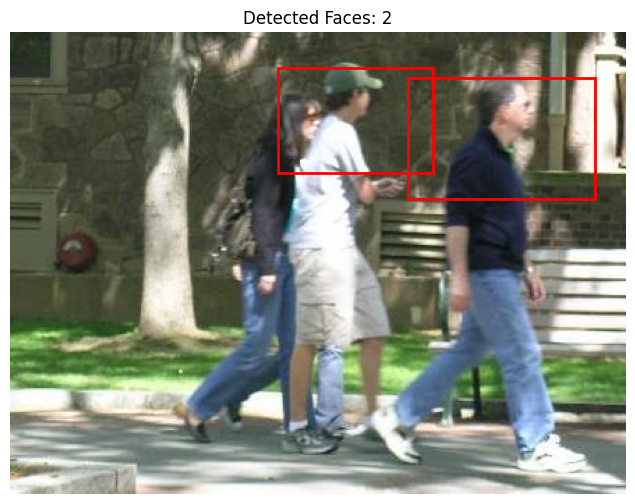

Image 19: Detected 1 faces


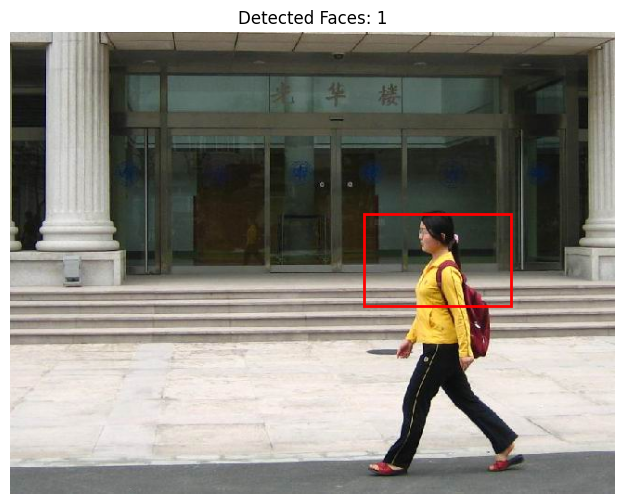

Image 20: Detected 1 faces


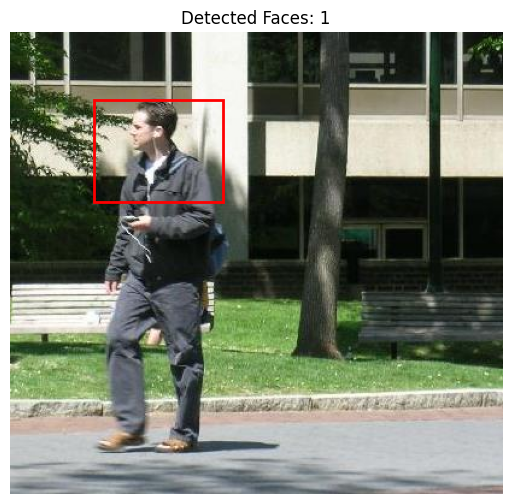

Accuracy: 0.5714, Precision: 0.7568, Recall: 0.7000, F1-score: 0.7273


In [24]:
def evaluate(model, data_loader_test, device):
    model.eval()
    total_TP = 0
    total_FP = 0
    total_FN = 0
    with torch.no_grad():
        for idx, (images, targets) in enumerate(data_loader_test):
            images = list(img.to(device) for img in images)
            outputs = model(images)
            for i, image in enumerate(images):
                img = image.cpu().numpy().transpose(1, 2, 0)
                fig, ax = plt.subplots(1, figsize=(8, 6))
                ax.imshow(img)
                boxes = outputs[i]['boxes'].cpu()
                scores = outputs[i]['scores'].cpu()
                labels = outputs[i]['labels'].cpu()
                # Apply NMS
                keep = nms(boxes, scores, iou_threshold=0.3)
                boxes = boxes[keep]
                scores = scores[keep]
                labels = labels[keep]
                # Filter out low-confidence detections
                conf_threshold = 0.7
                idxs = scores > conf_threshold
                boxes = boxes[idxs]
                scores = scores[idxs]
                labels = labels[idxs]
                # Count detections
                count = boxes.shape[0]
                # Draw boxes
                for box in boxes:
                    xmin, ymin, xmax, ymax = box
                    rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                             linewidth=2, edgecolor='red', facecolor='none')
                    ax.add_patch(rect)
                ax.axis('off')
                plt.title(f'Detected Faces: {count}')
                print(f"Image {idx+1}: Detected {count} faces")
                plt.show()
                # Prepare for metric computation
                gt_boxes = targets[i]['boxes'].cpu()
                # Match predictions to ground truth boxes
                matched_gt = []
                for pred_box in boxes:
                    if gt_boxes.shape[0] == 0:
                        total_FP += 1
                        continue
                    ious = torchvision.ops.box_iou(pred_box.unsqueeze(0), gt_boxes)
                    max_iou, max_idx = ious.max(1)
                    if max_iou.item() > 0.5 and max_idx.item() not in matched_gt:
                        total_TP += 1
                        matched_gt.append(max_idx.item())
                    else:
                        total_FP += 1
                # Count false negatives (ground truths not detected)
                total_FN += gt_boxes.shape[0] - len(matched_gt)
    # Compute metrics
    precision = total_TP / (total_TP + total_FP) if (total_TP + total_FP) > 0 else 0
    recall = total_TP / (total_TP + total_FN) if (total_TP + total_FN) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    accuracy = total_TP / (total_TP + total_FP + total_FN) if (total_TP + total_FP + total_FN) > 0 else 0

    print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}")


# Run evaluation
evaluate(model, data_loader_test, device)
